<a href="https://colab.research.google.com/github/TsaiShih/text_to_photo/blob/main/Text_to_photo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://github.com/camenduru/stable-diffusion-webui-colab

In [ ]:
#@title System download { run: "auto"}

print("安裝系統\nThis beginning section would take a while until the system is ready!!!")

!pip install diffusers transformers accelerate scipy safetensors

import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

#text - image
device = "cuda"

model_id_dreamlike = "dreamlike-art/dreamlike-photoreal-2.0"
pipe1 = StableDiffusionPipeline.from_pretrained(model_id_dreamlike,safety_checker=None, torch_dtype=torch.float16).to(device)

model_id_openjourney = "prompthero/openjourney"
pipe2 = StableDiffusionPipeline.from_pretrained(model_id_openjourney,safety_checker=None, torch_dtype=torch.float16).to(device)

model_id_stable_diffusion = "stabilityai/stable-diffusion-2-1"
pipe3 = StableDiffusionPipeline.from_pretrained(model_id_stable_diffusion,safety_checker=None, torch_dtype=torch.float16)
pipe3.scheduler = DPMSolverMultistepScheduler.from_config(pipe3.scheduler.config)
pipe3 = pipe3.to(device)


def text_photo(pipe,prompt, quantity):
    q = quantity
    for i in range(0,q):
      image = pipe(prompt).images[0]
      image.save("./image{}.jpg".format(i))
      image.show()



print("系統已安裝完成\nThe system is ready")


安裝系統
This beginning section would take a while until the system is ready!!!
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


系統已安裝完成
The system is ready


Engine: Dream like
Prompt: Ireland, landscape, animals 
Pictures: 3


  0%|          | 0/50 [00:00<?, ?it/s]

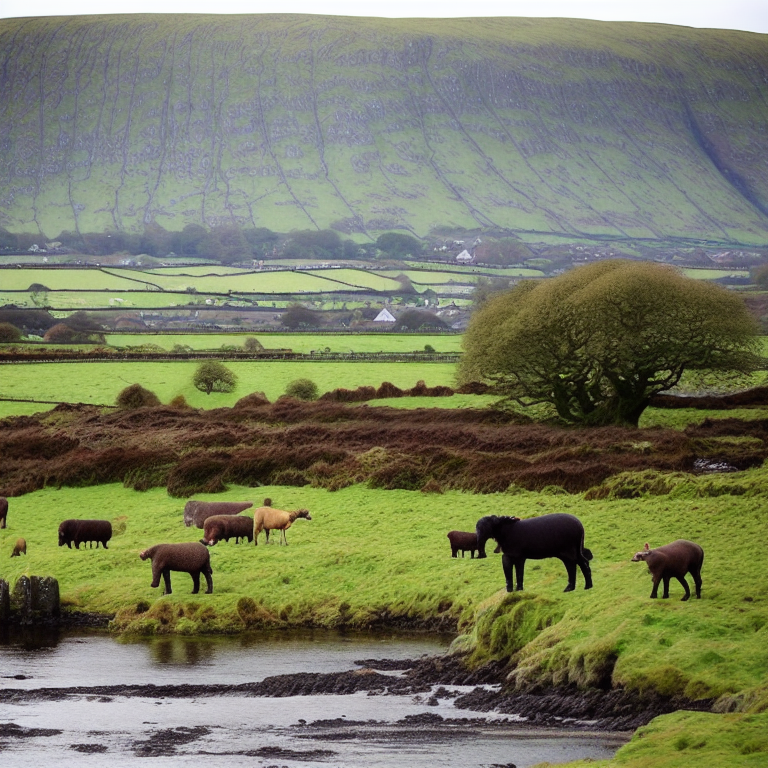

  0%|          | 0/50 [00:00<?, ?it/s]

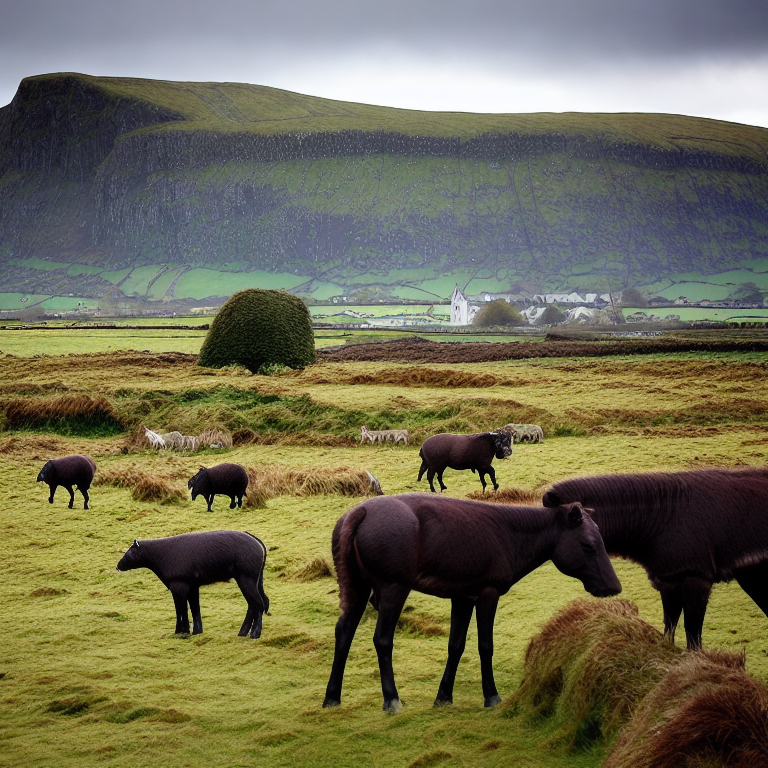

  0%|          | 0/50 [00:00<?, ?it/s]

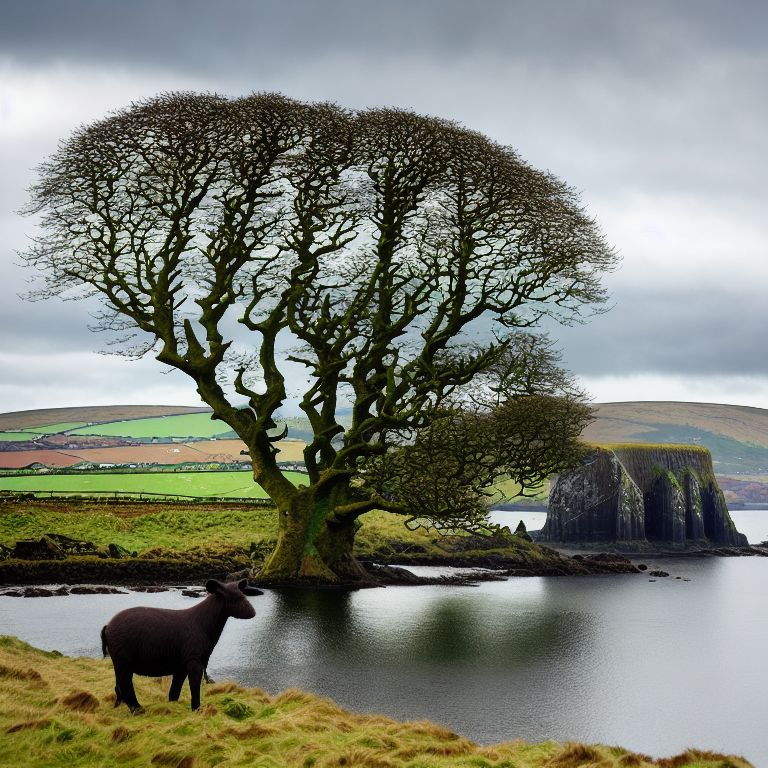

In [ ]:
#@title Text to Images

Engine = 'Dream like' #@param ['Dream like', 'Openjourney', 'Stable Diffusion']
Prompt = 'Ireland, landscape, animals' #@param {type:"string"}

#@markdown 1 to 5 pictures
Pictures = 3 #@param {type: "number", min:1, max:5}

if Pictures < 6 and Pictures > 0:
  print("Engine: {}\nPrompt: {} \nPictures: {}".format(Engine,Prompt,Pictures))

  if Engine == "Dream like":
    pipe = pipe1
  elif Engine == "Openjourney":
    pipe = pipe2
  else:
    pipe = pipe3

  prompt = Prompt
  quantity = Pictures
  text_photo(pipe,prompt,quantity)
else:
    print("Please enter the correct amount of pictures between 1 to 5")


# Not ready


In [ ]:
#@title Text_depth_photo
Engine =
Prompt = 'air, code, fair,chicken,hot' #@param {type:"string"}
Pictures = 1 #@param {type: "slider", min:1, max:3, step:1}

image_name,prompt, quantity, strength=0.75,guidance_scale=7.5


#text + image - image
from PIL import Image
from diffusers import StableDiffusionImg2ImgPipeline, StableDiffusionDepth2ImgPipeline

generator = torch.Generator(device=device).manual_seed(1024)
pipe_img_img = StableDiffusionImg2ImgPipeline.from_pretrained("nitrosocke/Ghibli-Diffusion",safety_checker=None, torch_dtype=torch.float16).to(device)



def text_photo_photo(image_name,prompt, quantity, strength=0.75,guidance_scale=7.5):
  if image_name != "":
    init_image =Image.open("../content/{}.jpg".format(image_name)).convert("RGB")
    init_image.thumbnail((768, 768))
    init_image
  else:
    print("No guidence image")
  q = quantity
  for i in range(0,q):
    image = pipe_img_img(prompt, image=init_image, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
    image.save("./result{}.jpg".format(i))
    image.show()



pipe_deth_img = StableDiffusionDepth2ImgPipeline.from_pretrained("stabilityai/stable-diffusion-2-depth",safety_checker=None,torch_dtype=torch.float16,).to(device)

def text_depth_photo(image_name,prompt,n_prompt, quantity, strength=0.35):
  if image_name != "":
    init_image =Image.open("../content/{}.jpg".format(image_name)).convert("RGB")
    init_image.thumbnail((768, 768))
    init_image
  else:
    print("No guidence image")
  q = quantity
  for i in range(0,q):
    image = pipe_deth_img(prompt, image=init_image, negative_prompt=n_prompt, strength=strength).images[0]
    image.save("./result{}.jpg".format(i))
    image.show()

prompt = "cat"
n_prompt = "bad, deformed, ugly, bad anatomy"
image_name = "image0"

text_depth_photo(image_name,prompt,n_prompt,1,0.9)


Please enter the prompt - example: Tiger, forest
Enter prompt :lilith god, the eden garden, mdjrny-v4 style
Generate amount of images :2


  0%|          | 0/50 [00:00<?, ?it/s]

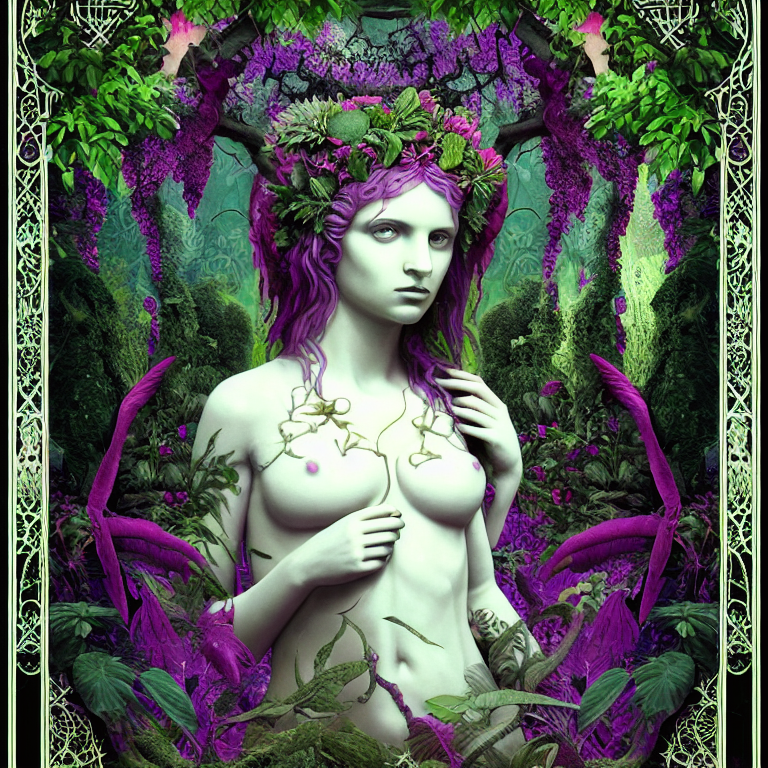

  0%|          | 0/50 [00:00<?, ?it/s]

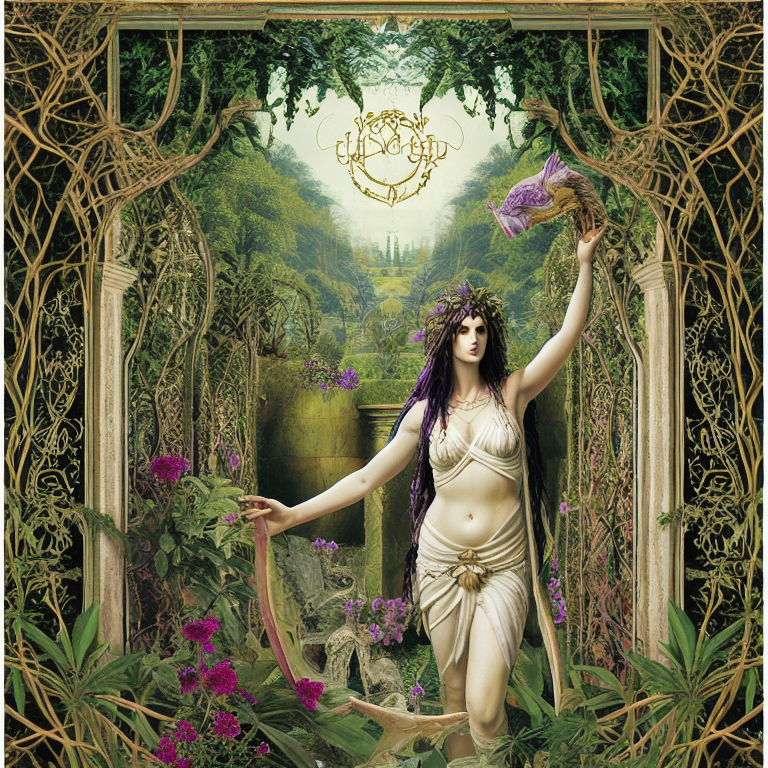

  0%|          | 0/37 [00:00<?, ?it/s]

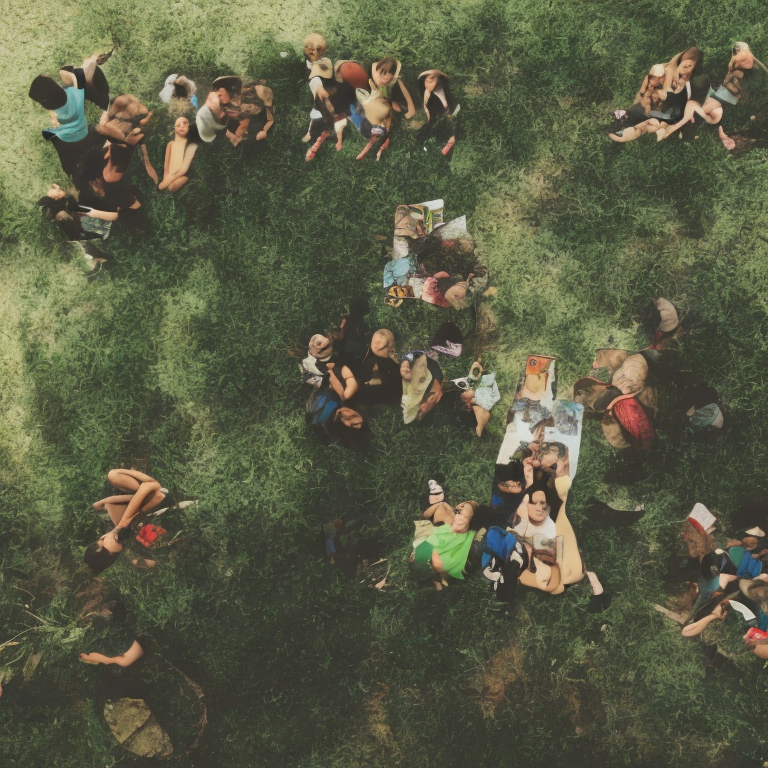

In [ ]:
prompt = "same pictures with people"
image_name = "image0"
text_photo_photo(image_name,prompt,1,0.75,7.5)

In [ ]:
#text_depth_photo

from diffusers import StableDiffusionDepth2ImgPipeline
pipe3 = StableDiffusionDepth2ImgPipeline.from_pretrained("stabilityai/stable-diffusion-2-depth",safety_checker=None,torch_dtype=torch.float16,).to(device)

def text_depth_photo(image_name,prompt,n_prompt, quantity, strength=0.35):
  if image_name != "":
    init_image =Image.open("../content/{}.jpg".format(image_name)).convert("RGB")
    init_image.thumbnail((768, 768))
    init_image
  else:
    print("No guidence image")
  q = quantity
  for i in range(0,q):
    image = pipe3(prompt, image=init_image, negative_prompt=n_prompt, strength=strength).images[0]
    image.save("./result{}.jpg".format(i))
    image.show()

prompt = "cat"
n_prompt = "bad, deformed, ugly, bad anatomy"
image_name = "image0"

text_depth_photo(image_name,prompt,n_prompt,1,0.9)

## Midjourney 4

In [ ]:
!pip install diffusers==0.10.2 transformers scipy ftfy accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 503.1/503.1 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 42.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 59.0 MB/s eta 0:00:00


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
model_id = "prompthero/openjourney"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

## Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

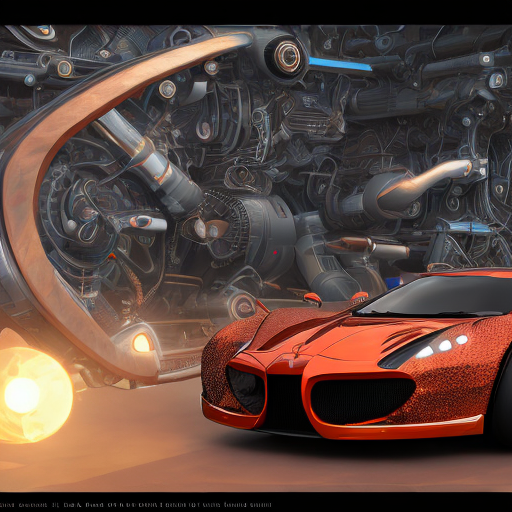

In [ ]:
prompt = "an fancy car with high tech style reality texture, mdjrny-v4 style"
image = pipe(prompt).images[0]
image.save("./mdj4.png")
image.show()

## Stable diffusion

In [ ]:
!pip install diffusers transformers accelerate scipy safetensors

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.5 MB/s eta 0:00:00


In [ ]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

model_id = "stabilityai/stable-diffusion-2-1"

# Use the DPMSolverMultistepScheduler (DPM-Solver++) scheduler here instead
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")



Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <cell line: 7>:7                                                                              │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/diffusers/pipeline_utils.py:709 in from_pretrained       │
│                                                                                                  │
│   706 │   │   │   │                                                                              │
│   707 │   │   │   │   # check if the module is in a subdirectory                                 │
│   708 │   │   │   │   if os.path.isdir(os.path.join(cached_folder, name)):                       │
│ ❱ 709 │   │   │   │   │   loaded_sub_model = load_method(os.path.join(cached_folder, name), **   │
│   710 │   │   │   │   else:                                                                      │
│   711 │   │   │   │   │   # else load from the root directory                                    │
│   712 │   │   │   │   │   loaded_sub_model = load_method(cached_folder, **loading_kwargs)        │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:2542 in from_pretrained   │
│                                                                                                  │
│   2539 │   │   if from_pt:                                                                       │
│   2540 │   │   │   if not is_sharded and state_dict is None:                                     │
│   2541 │   │   │   │   # Time to load the checkpoint                                             │
│ ❱ 2542 │   │   │   │   state_dict = load_state_dict(resolved_archive_file)                       │
│   2543 │   │   │                                                                                 │
│   2544 │   │   │   # set dtype to instantiate the model under:                                   │
│   2545 │   │   │   # 1. If torch_dtype is not None, we use that dtype                            │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:433 in load_state_dict    │
│                                                                                                  │
│    430 │   """                                                                                   │
│    431 │   if checkpoint_file.endswith(".safetensors") and is_safetensors_available():           │
│    432 │   │   # Check format of the archive                                                     │
│ ❱  433 │   │   with safe_open(checkpoint_file, framework="pt") as f:                             │
│    434 │   │   │   metadata = f.metadata()                                                       │
│    435 │   │   if metadata.get("format") not in ["pt", "tf", "flax"]:                            │
│    436 │   │   │   raise OSError(                                                                │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'safe_open' is not defined

## Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

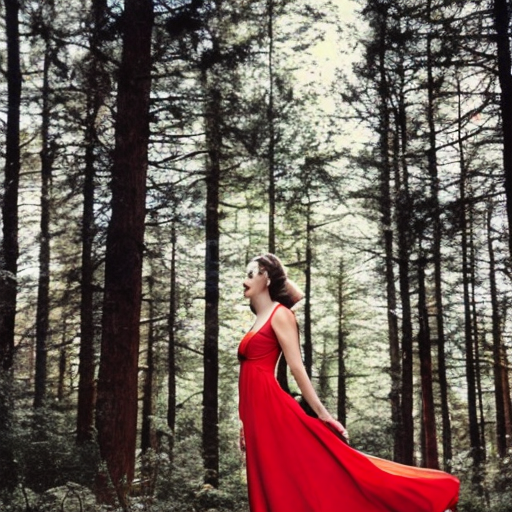

In [ ]:
prompt = "lady with beautiful red dress in the forest with angels face"
image = pipe(prompt).images[0]

image.save("stb2-1.png")
image.show()